In [1]:
#!/usr/bin/python3
import math
import numpy as np
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.colors as mplcolor
import seaborn as sns
from adjustText import adjust_text
from scipy.stats import spearmanr

In [2]:
plt.rcParams['figure.figsize'] = 4,4
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 11
plt.rcParams['figure.titlesize'] = 13
plt.rcParams['legend.fontsize'] = 12

In [3]:
language_codes = pd.read_csv("data/language-codes-full.csv")
language_codes = language_codes[["alpha3-b", "alpha2", "English"]]

language_codes

,alpha3-b,alpha2,English
0,aar,aa,Afar
1,abk,ab,Abkhazian
2,ace,NaN,Achinese
3,ach,NaN,Acoli
4,ada,NaN,Adangme
...,...,...,...
482,znd,NaN,Zande languages
483,zul,zu,Zulu
484,zun,NaN,Zuni
485,zxx,NaN,No linguistic content; Not applicable


In [4]:
colors_langs_dict = {"English": "#666666", 
                    "Ukrainian": "#e7298a",
                    "Polish": "#d95f02",
                    "German": "#d95f02",
                    "Russian": "#1b9e77",
                    "Ukrainian refugees": "#000000",
                    "DANE": "#000000"}

In [5]:
# Helper function to read and preprocess Wikipedia view data
def load_wikipedia_views(filepath, column_name):
    df = pd.read_csv(filepath)
    df.drop(columns=["timeRange.start", "timeRange.end"], inplace=True)
    df["month"] = pd.to_datetime(df["month"]).dt.tz_localize(None)
    df.set_index("month", inplace=True)
    df.columns = [column_name]
    return df

# Load baseline English data
df_denominator = pd.read_csv("data/daily_views_en_wikipedia_all.csv")
df_denominator.drop(columns=["timeRange.start", "timeRange.end"], inplace=True)
df_denominator["month"] = pd.to_datetime(df_denominator["month"]).dt.tz_localize(None)
df_denominator.columns = ["Wikipedia Page Language", "English"]
df_denominator.set_index("Wikipedia Page Language", inplace=True)

# Languages to process: (file prefix, human-readable name)
languages = [
    ("pl", "Polish"), ("ru", "Russian"), ("uk", "Ukrainian"), ("lt", "Lithuanian"),
    ("de", "German"), ("ja", "Japanese"), ("es", "Spanish; Castilian"),
    ("fr", "French"), ("it", "Italian"), ("zh", "Chinese"), ("fa", "Persian"),
    ("pt", "Portuguese"), ("ar", "Arabic"), ("tr", "Turkish"), ("id", "Indonesian"),
    ("nl", "Dutch; Flemish")
]

# Merge all language datasets into the baseline
for code, name in languages:
    filepath = f"data/daily_views_{code}_wikipedia_all.csv"
    df_lang = load_wikipedia_views(filepath, name)
    df_denominator = df_denominator.merge(df_lang, left_index=True, right_index=True)

# Transpose for final structure
df_denominator = df_denominator.T
df_denominator.index.names = ["Wikipedia Page Language"]
df_denominator.columns.names = ["index"]

In [6]:
def trim_dates(df, start, end):
    """Return dataframe limited to date range [start, end]."""
    return df[(df.index >= start) & (df.index <= end)]


def resample_views(df, freq="W-Mon", label="Weeks"):
    """
    Resample transposed Wikipedia view data.
    freq: 'W-Mon', 'M', or 'Y'
    label: 'Weeks', 'Months', 'Years'
    """
    df_resampled = df.T.reset_index().rename(columns={'index': label})
    df_resampled[label] = pd.to_datetime(df_resampled[label])
    
    value_cols = df_resampled.columns.difference([label]) # numeric columns only (exclude label)
    
    if freq == "M":
        df_resampled = df_resampled.groupby(df_resampled[label].dt.to_period("M"))[value_cols].sum()
    elif freq == "Y":
        df_resampled = df_resampled.groupby(df_resampled[label].dt.to_period("Y"))[value_cols].sum()
    else:
        df_resampled = df_resampled.resample(freq, label="left", closed="left", on=label)[value_cols].sum()
    return df_resampled
    
def normalize_by_denominator(df_numerator, df_denominator, languages):
    """Normalize numerator by denominator for selected languages.
    Keeps only rows where both dataframes share the same index.
    """
    # restrict to common index
    common_index = df_numerator.index.intersection(df_denominator.index)
    df_num = df_numerator.loc[common_index]
    df_den = df_denominator.loc[common_index]

    # normalize
    df_norm = pd.DataFrame(index=common_index)
    for lang in languages:
        df_norm[lang] = df_num[lang] / df_den[lang]
    return df_norm

In [7]:
def read_and_preprocess_wiki_file(path, language_codes_df):
    """Read one Wikipedia CSV, clean columns, merge language codes."""
    df = pd.read_csv(path, low_memory=False)
    df.drop(columns=[c for c in ["Title", "Source", "Badges"] if c in df.columns], inplace=True)

    df = (
        df.merge(language_codes_df[["alpha2", "English"]], how="left", left_on="Language", right_on="alpha2")
        .merge(language_codes_df[["alpha3-b", "English"]], how="left",
        left_on=["Language", "English"], right_on=["alpha3-b", "English"])
    )
        
    df["Wikipedia Page Language"] = df["English"].fillna(df["Language"])
    df.drop(columns=["Language", "alpha2", "alpha3-b", "English"], inplace=True)
    df.set_index("Wikipedia Page Language", inplace=True)
    df.columns = pd.to_datetime(df.columns)
    
    return df


def get_official_languages(city, lang_e_data_path="data/countries-capitals-europe.csv", lang_w_data_path="data/countries-capitals-world.csv"):
    """Return list of official languages for a given city (if available)."""
    df_e = pd.read_csv(lang_e_data_path)
    df_w = pd.read_csv(lang_w_data_path)
    df_languages = pd.concat([df_e, df_w])

    langs = df_languages[df_languages["capital"] == city]["language"]
    if langs.empty:
        return []
    # assume languages are separated by comma
    return [l for l in langs.values[0].split('\'') if len(l) > 3]


def assign_colors_to_languages(official_langs, base_colors=None):
    """Assign consistent colors to languages."""
    if base_colors is None:
        base_colors = {
        "English": "#666666",
        "Ukrainian": "#e7298a",
        "Russian": "#1b9e77"
        }
    remaining_colors = ['#d95f02', '#7570b3', '#1f78b4', '#e31a1c', '#e6ab02']

    for i, lang in enumerate(official_langs):
        if lang not in base_colors and i < len(remaining_colors):
            base_colors[lang] = remaining_colors[i]
    return base_colors

In [8]:
def print_latex_stats(df, sort=False):
    """Create a LATEX table with the satats information."""
    if sort:
        stats_latex = df.sort_index()
    else:
        stats_latex = df

    for c in stats_latex.columns:
        if "time" in c:
            stats_latex[c] = pd.to_datetime(stats_latex[c]).dt.strftime('%d.%m.%y')

        else:
            if "perc" in c or "rel_change" in c:
                stats_latex[c] = stats_latex[c].round(2).astype(str) + "\\%" 
            
    print(stats_latex.to_latex(multirow=True))

    
def plot_boxplots(df, col, remove=["Poland", "Gliwice"], name="PL", save=False):
    """Draw boxplots of a column grouped by language."""
    
    box_data = df[[col]].sort_index().reset_index()
    box_data.rename(columns={"level_0": "Wikipedia Page", "level_1": "Language"}, inplace=True)
    box_data = box_data[~box_data["Wikipedia Page"].isin(remove)]
    
    
    PROPS = {
        'boxprops': {'facecolor': 'white', 'edgecolor': 'black'},
        'medianprops': {'color': 'black'},
        'whiskerprops': {'color': 'black'},
        'capprops': {'color': 'black'}
    }
    
    sns.boxplot(data=box_data, x=col, y="Language", whis=[5, 95], **PROPS)
    plt.title(f"Boxplot of {col} by Language")
    plt.tight_layout()
    
    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/"
        os.makedirs(output_dir, exist_ok=True)            
        plt.savefig(f"{output_dir}/boxplot-relchange-{name}-{col}.pdf", format="pdf", bbox_inches="tight")
        
    plt.show()


def plot_bars(df, colors_dict, country_code, city, note_title, note_save, save=False):
    ax = df.plot(kind="bar", color=[colors_dict.get(c, "gray") for c in df.columns], figsize=(5, 3))
    
    ax.set_title(f"{city}\n{note_title}")
    ax.tick_params(axis="x", rotation=0) # Do not rotate x-axis labels
    ax.set_xlabel("") # Remove x-axis label
    ax.legend(title=None, loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=len(df.columns), fontsize=10)
    
    plt.tight_layout()
    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/{country_code}/"
        os.makedirs(output_dir, exist_ok=True)                    
        plt.savefig(f"{output_dir}/{note_save}-{city}.pdf", format="pdf", bbox_inches="tight")
        
    plt.show()


def plot_lines(df, colors_langs_dict, country_code, city, note_title, note_save, highlight_date="2022-02-24", save=False):
    df = df.reindex(sorted(df.columns), axis=1)
    axes = df.plot.line(subplots=True, color=colors_langs_dict, lw=3)
    fig = axes[0].get_figure()
    
    fig.suptitle(f"{city}\n{note_title}")

    # iterate through each axes to use axes level methods
    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=None)
        ax.legend(handletextpad=-2.0, handlelength=0, loc='upper left',
                  bbox_to_anchor=(0.08, 1.1), frameon=False)
        ax.vlines(x=highlight_date, ymin=df.min().min(), ymax=df.max().max(),
                  linestyles="dashed", color="gray", zorder=10)
        ax.ticklabel_format(axis='y', scilimits=[-3, 3])

        if note_save in {"prop-relative-change-mean", "prop-relative-change-median", 
                         "prop-relative-change", "relative-change"}:
            ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x:.0f}%"))
            ax.tick_params(axis="y", labelsize=14)

        # hide scientific notation offset except first subplot
        if i > 0:
            ax.yaxis.get_offset_text().set_visible(False)

    plt.subplots_adjust(top=0.85)

    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/{country_code}/"
        os.makedirs(output_dir, exist_ok=True)                    
        plt.savefig(f"{output_dir}/{note_save}-{city}.pdf", format="pdf", bbox_inches="tight")
        
    plt.show()

In [9]:
def timeseries_relative_change_prop(csv_files_preprocess, df_denominator, list_off_langs=None, 
                                    country_code="WORLD", date_plot_start="2020-08-24", 
                                    date_plot_end="2023-08-24", date_baseline_start="2020-02-24",
                                    date_baseline_end="2020-08-24", date_crisis="2022-02-24"):
    """
    Main analysis pipeline: generates plots & summary stats for Wikipedia view data.
    """
    language_codes = pd.read_csv("data/language-codes-full.csv")[['alpha3-b', 'alpha2', 'English']]
    stats = {}
        
    for f in csv_files_preprocess:
        city = f.split("\\")[-1].split(".")[0].replace(",", " ")  
        df_raw = read_and_preprocess_wiki_file(f, language_codes)

        #assigning color to the languages added
        if list_off_langs:
            official_langs = list_off_langs
        else:
            official_langs = get_official_languages(city)

        #all the languages considered in the analysis
        colors_dict = assign_colors_to_languages(official_langs)
        languages = [l for l in colors_dict if l in df_raw.index]

        # Ensure denominator languages align
        available_langs = [l for l in df_denominator.index.tolist() if l in df_raw.index]
        df_raw = df_raw.loc[available_langs]
            
        # --- Daily
        df_daily = trim_dates(df_raw.T, date_plot_start, date_plot_end)
        #plot_lines(df_daily[languages], colors_dict, country_code, city, "Daily views", "daily-views")
            
        df_prop_daily = normalize_by_denominator(df_daily, df_denominator.T.loc[df_daily.index], available_langs)
        plot_lines(df_prop_daily[languages], colors_dict, country_code, city, "Proportion of daily views", "prop-daily-views")
        
        # --- Weekly
        df_weekly = resample_views(df_raw, "W-Mon", "Weeks")
        df_weekly_trim = trim_dates(df_weekly, date_plot_start, date_plot_end)
        #plot_lines(df_weekly_trim[languages], colors_dict, country_code, city, "Weekly views", "weekly-views")
        
        df_denom_weekly = resample_views(df_denominator, "W-Mon", "Weeks")
        df_prop_weekly_trim = normalize_by_denominator(df_weekly_trim, df_denom_weekly.loc[df_weekly_trim.index], available_langs)
        plot_lines(df_prop_weekly_trim[languages], colors_dict, country_code, city, "Proportion of weekly views", "prop-weekly-views")
            
        # --- Monthly
        df_monthly = resample_views(df_raw, "M", "Months")
        df_monthly_trim = df_monthly.loc[(pd.Timestamp(date_plot_start) - pd.DateOffset(months=1)).to_period("M"):
        (pd.Timestamp(date_plot_end) + pd.DateOffset(months=1)).to_period("M")]
        #plot_lines(df_monthly_trim[languages], colors_dict, country_code, city, "Monthly views", "monthly-views")
        
        df_denom_monthly = resample_views(df_denominator, "M", "Months")
        df_prop_monthly_trim = normalize_by_denominator(df_monthly_trim, df_denom_monthly.loc[df_monthly_trim.index], available_langs)
        #plot_lines(df_prop_monthly_trim[languages], colors_dict, country_code, city, "Proportion of monthly views", "prop-monthly-views")
        
        # --- Yearly
        df_yearly = resample_views(df_raw, "Y", "Years")
        df_yearly_trim = df_yearly.loc[pd.Timestamp(date_plot_start).to_period("Y"):
        (pd.Timestamp(date_plot_end) + pd.DateOffset(years=1)).to_period("Y")]
        #plot_bars(df_yearly_trim[languages], colors_dict, country_code, city, "Yearly views", "yearly-views")
        
        df_denom_yearly = resample_views(df_denominator, "Y", "Years")
        df_prop_yearly_trim = normalize_by_denominator(df_yearly_trim, df_denom_yearly.loc[df_yearly_trim.index], available_langs)
        plot_bars(df_prop_yearly_trim[languages], colors_dict, country_code, city, "Proportion of yearly views", "prop-yearly-views")
            
        # --- Relative Change (Weekly YoY)
        df_prop_weekly = normalize_by_denominator(df_weekly, df_denom_weekly, available_langs)
        df_rel_change = 100 * (df_prop_weekly / df_prop_weekly.shift(52) - 1)        
        df_rel_change = trim_dates(df_rel_change, date_plot_start, date_plot_end)

        if df_rel_change.isna().any().any():  # check if any NaN exists in the DataFrame
            print(f"""{city} - Relative change contains NaN values due to missing data one year before.""")

        if df_rel_change[languages].isna().any().any(): # check if any NaN exists in the DataFrame
            print(f"""{city} - Relative change contains NaN values due to missing data one year before. 
            For important languages: {languages}!""")
            #print(df_rel_change[languages][df_rel_change[languages].isna().any(axis=1)])

        #df_rel_change = df_rel_change.dropna()
        
        if country_code in ["PL", "DE"]:
            plot_lines(df_rel_change[languages], colors_dict, country_code, city, "Relative change in weekly views", "prop-relative-change", save=True)
        else:
            plot_lines(df_rel_change[languages], colors_dict, country_code, city, "Relative change in weekly views", "prop-relative-change")
        
        # --- Save outputs
        output_dir = f"data_cities_{country_code}/preprocessed"
        os.makedirs(output_dir, exist_ok=True)
        
        #df_daily.to_csv(f"{output_dir}/{city}-daily.csv")
        df_prop_daily.to_csv(f"{output_dir}/{city}-prop-daily.csv")
        #df_weekly_trim.to_csv(f"{output_dir}/{city}-weekly.csv")
        #df_prop_weekly_trim.to_csv(f"{output_dir}/{city}-prop-weekly.csv")
        #df_monthly_trim.to_csv(f"{output_dir}/{city}-monthly.csv")
        #df_prop_monthly_trim.to_csv(f"{output_dir}/{city}-prop-monthly.csv")
        #df_yearly_trim.to_csv(f"{output_dir}/{city}-yearly.csv")
        df_prop_yearly_trim.to_csv(f"{output_dir}/{city}-prop-yearly.csv")
        df_rel_change.to_csv(f"{output_dir}/{city}-rel-change.csv")
        
        # --- Stats collection
        date_crisis = pd.Timestamp(date_crisis)
        one_month_window = date_crisis + pd.DateOffset(months=1)
        df_rel_change_window = trim_dates(df_rel_change, date_crisis, one_month_window)
        
        stats[city] = {}
        for lang in available_langs:
            stats[city][lang] = {
                "weekly_pre_median": df_prop_weekly_trim.loc[date_plot_start:date_crisis, lang].median(),
                "weekly_post_median": df_prop_weekly_trim.loc[date_crisis:date_plot_end, lang].median(),
            }
            stats[city][lang]["diff_weekly_median"] = (
                stats[city][lang]["weekly_post_median"] - stats[city][lang]["weekly_pre_median"]
            )
        
            if not df_rel_change_window[lang].empty:
                stats[city][lang]["rel_change_max_within1month"] = df_rel_change_window[lang].max()
                stats[city][lang]["rel_change_max_time_within1month"] = df_rel_change_window[lang].idxmax()
            else:
                stats[city][lang]["rel_change_max_within1month"] = None
                stats[city][lang]["rel_change_max_time_within1month"] = None
    
    # Save stats
    stats_reform = {
        (city, lang): vals for city, langs in stats.items() for lang, vals in langs.items()
    }
    df_stats = pd.DataFrame.from_dict(stats_reform, orient="index")
    df_stats.to_csv(f"data_cities_{country_code}/preprocessed/stats_relative_change.csv")
        
    return df_stats

## Europe

In [10]:
# use glob to get all the csv files in the folder
path = os.getcwd()
csv_files = glob.glob(os.path.join(path, "data_cities_EU/*.csv"))

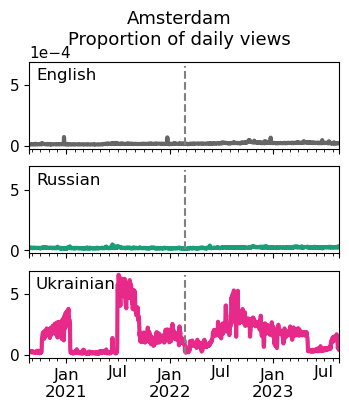

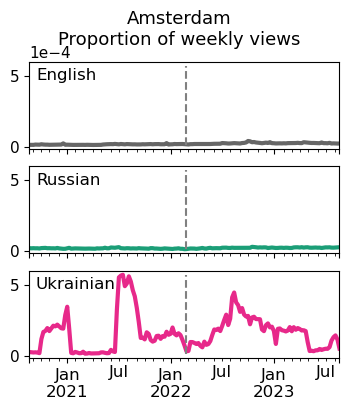

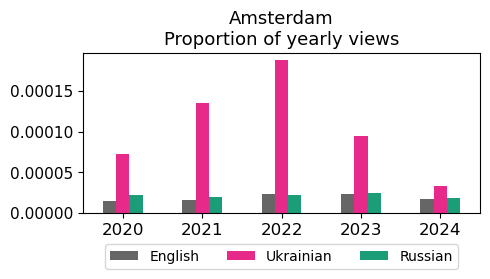

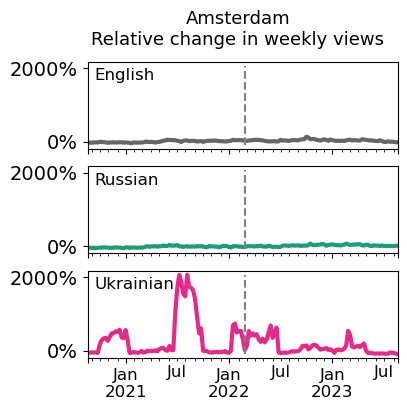

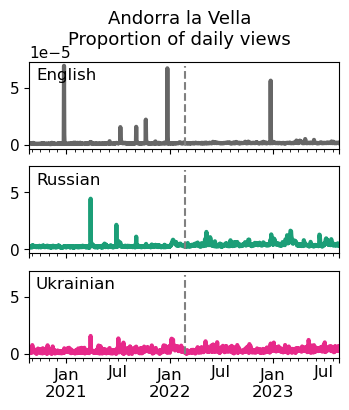

...

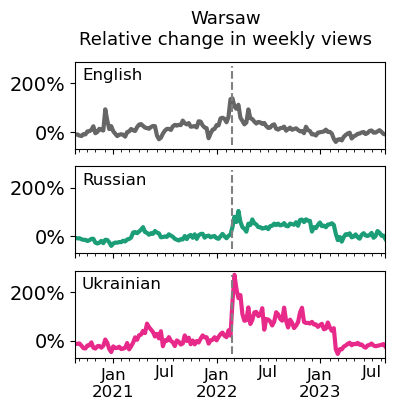

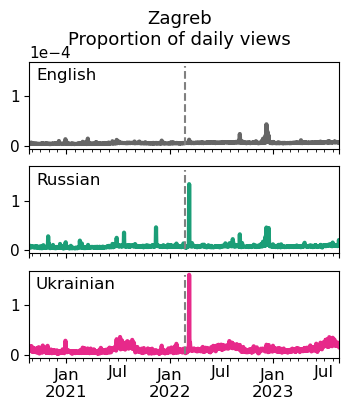

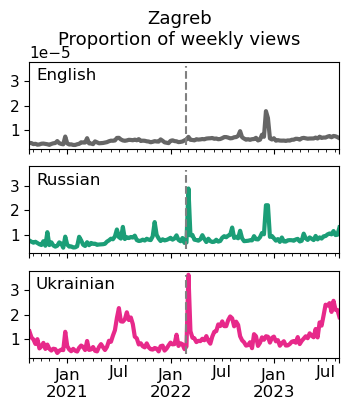

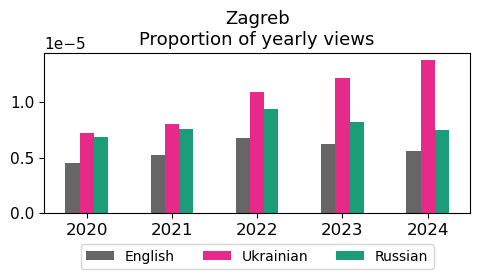

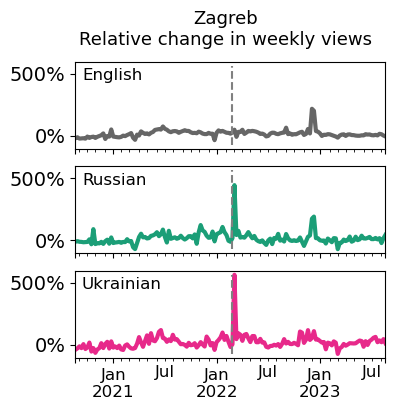

In [11]:
eu_capitals_stats = timeseries_relative_change_prop(csv_files, df_denominator, list_off_langs=[""], country_code="EU")

## Poland

In [12]:
# use glob to get all the csv files in the folder
path = os.getcwd()
csv_files = glob.glob(os.path.join(path, "data_cities_PL/*.csv"))

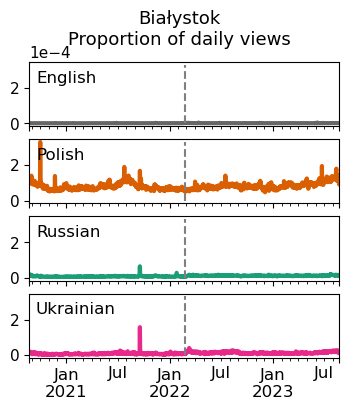

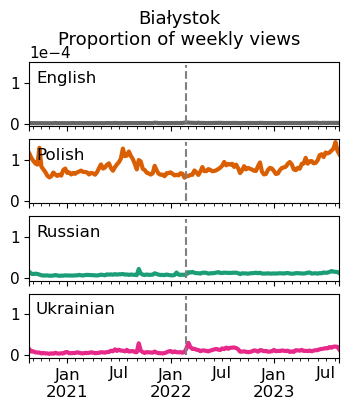

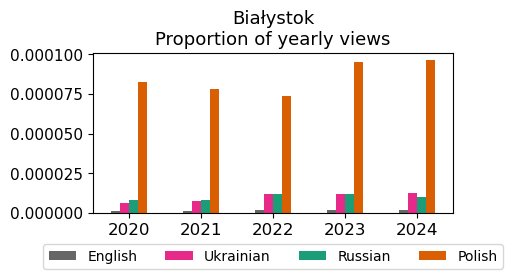

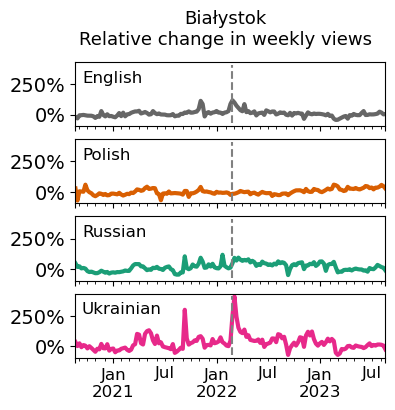

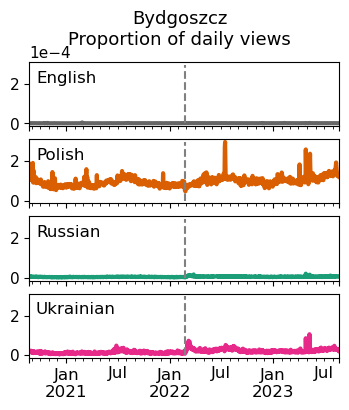

...

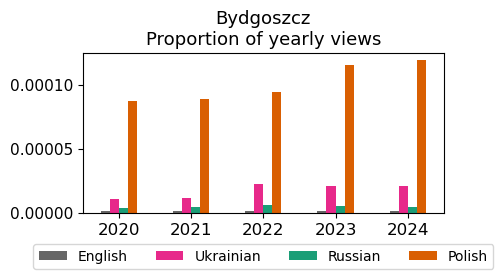

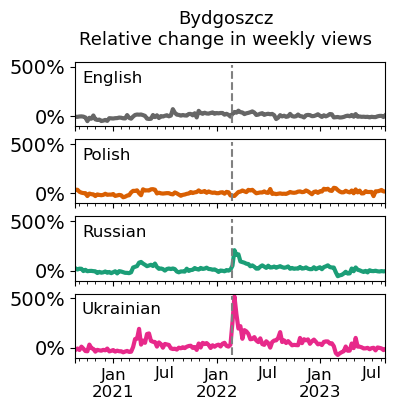

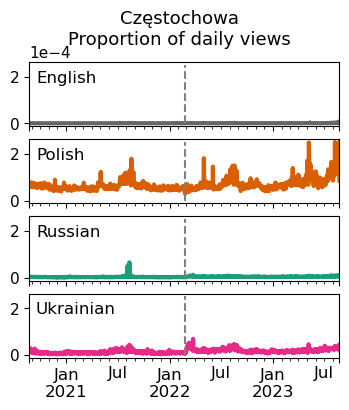

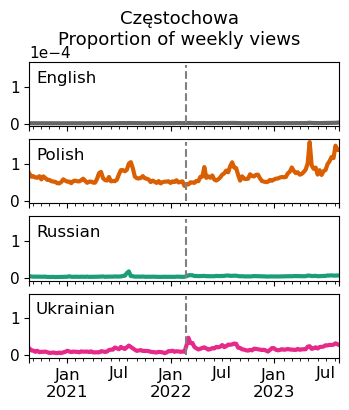

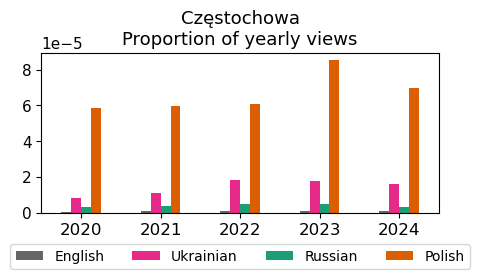

Częstochowa - Relative change contains NaN values due to missing data one year before.


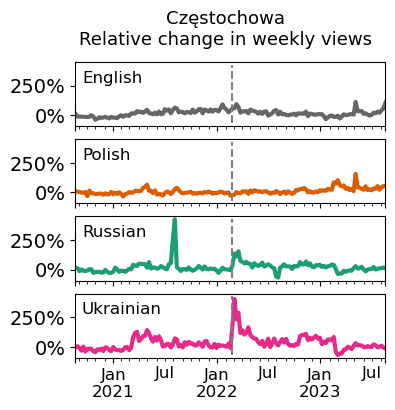

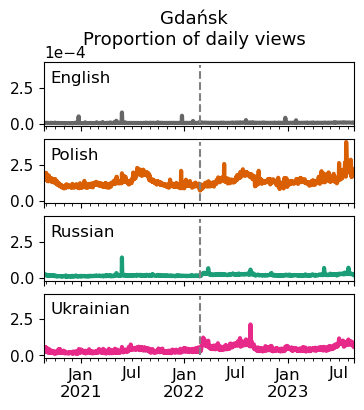

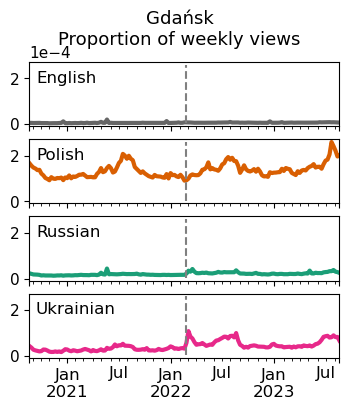

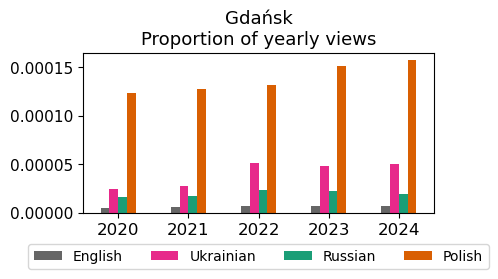

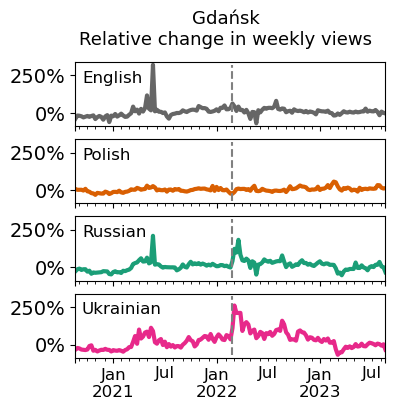

...

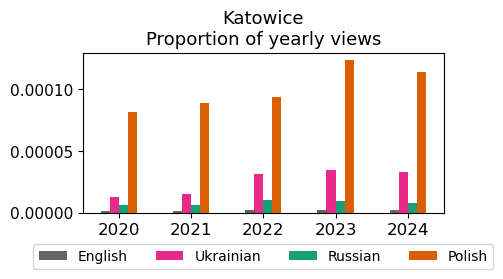

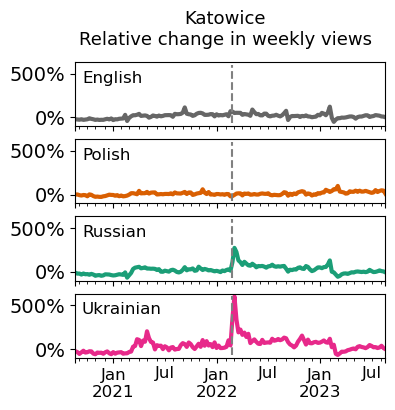

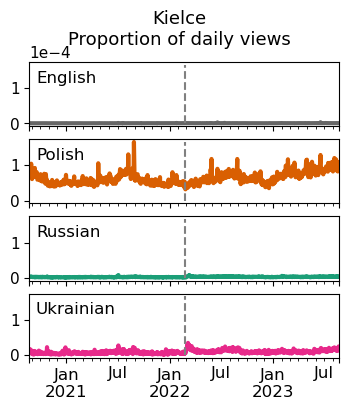

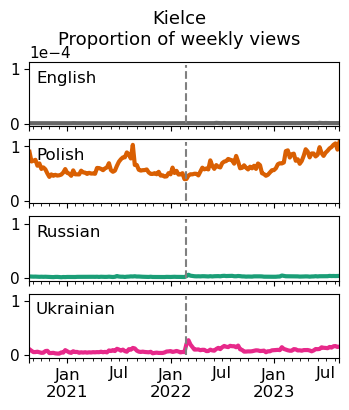

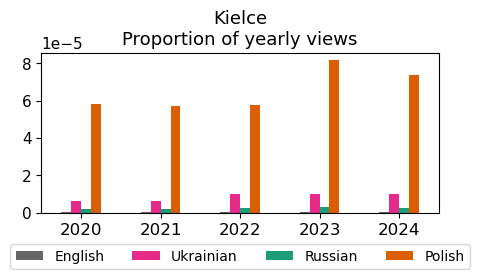

Kielce - Relative change contains NaN values due to missing data one year before.


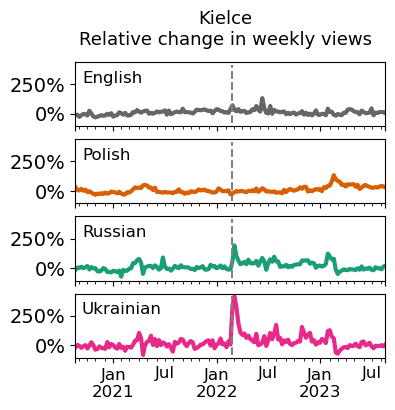

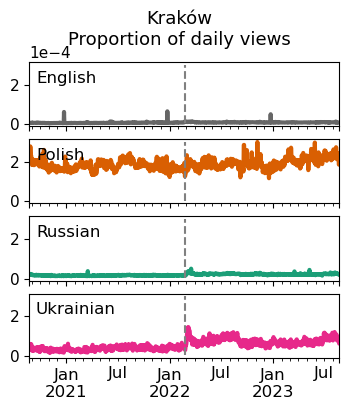

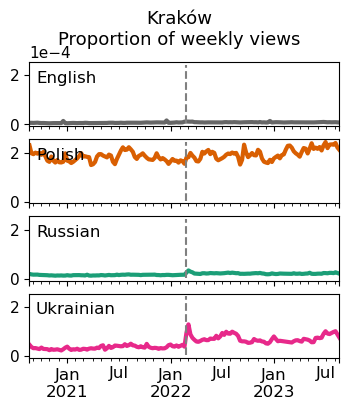

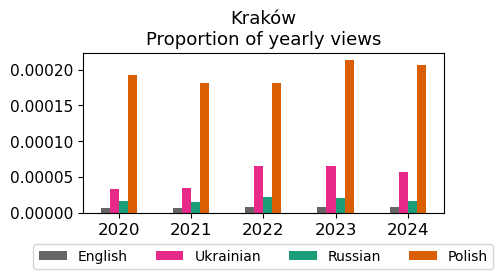

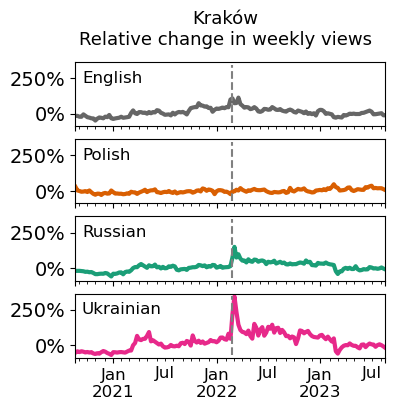

...

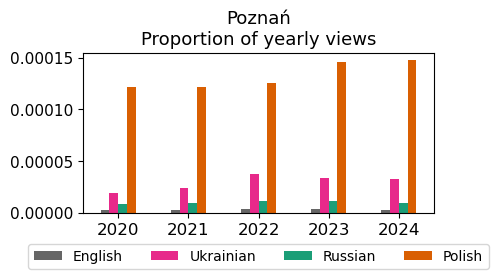

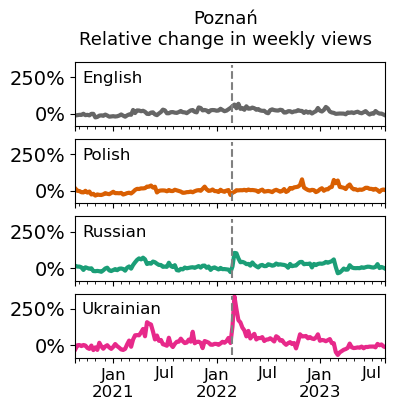

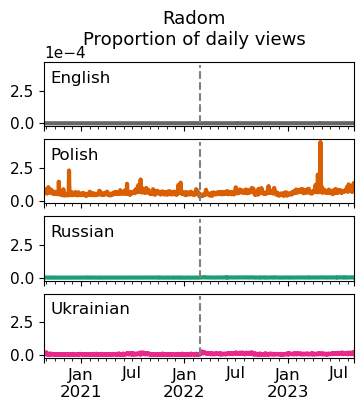

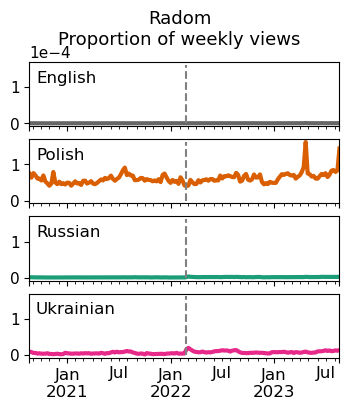

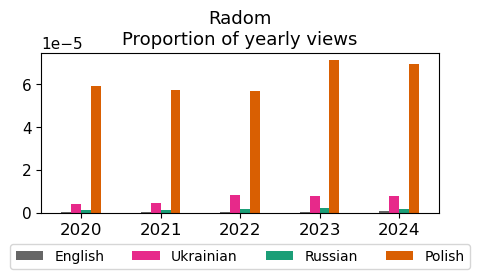

Radom - Relative change contains NaN values due to missing data one year before.


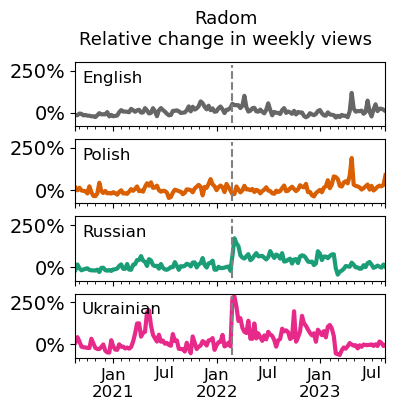

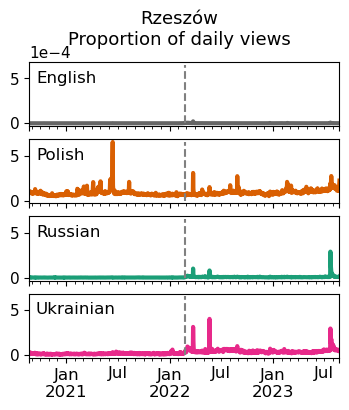

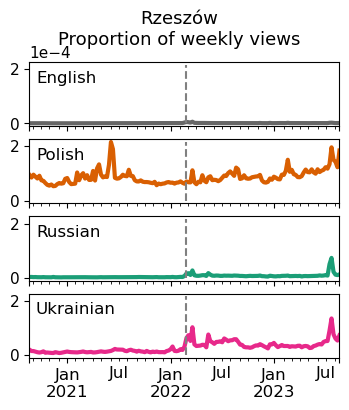

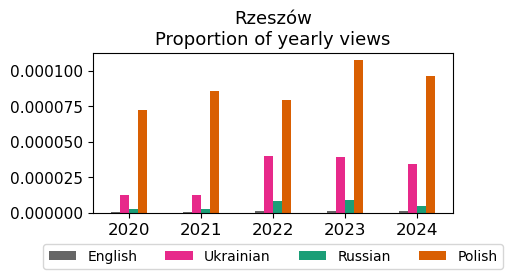

Rzeszów - Relative change contains NaN values due to missing data one year before.


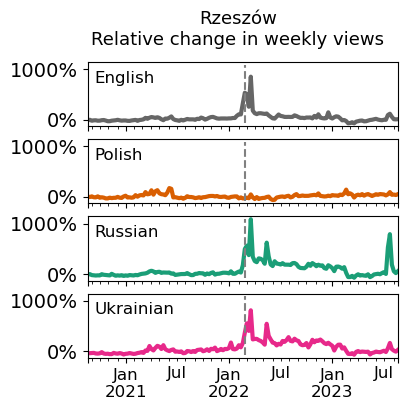

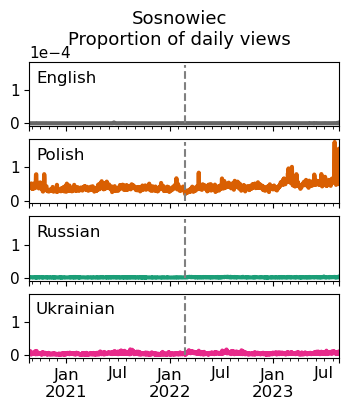

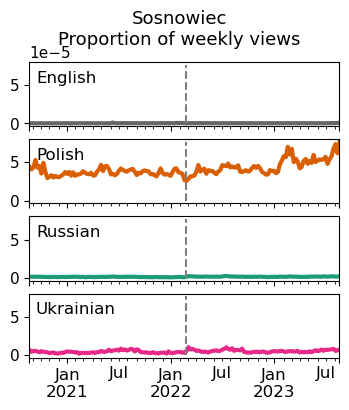

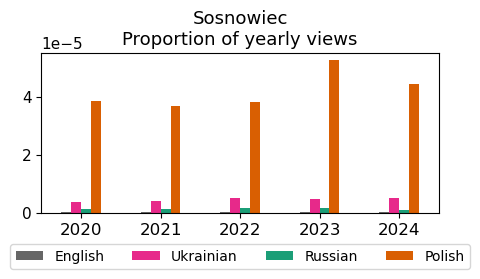

Sosnowiec - Relative change contains NaN values due to missing data one year before.


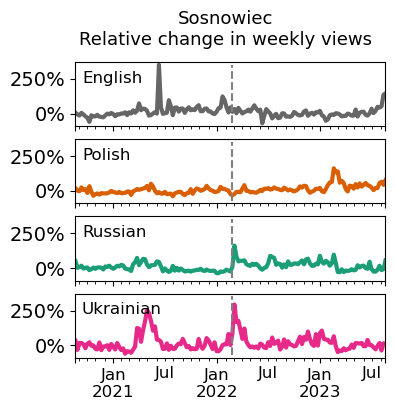

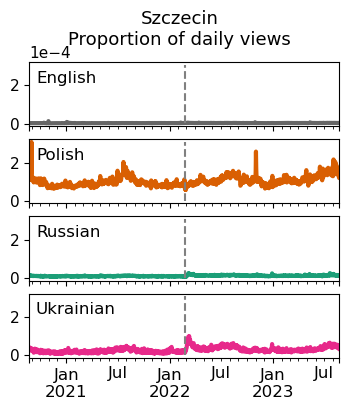

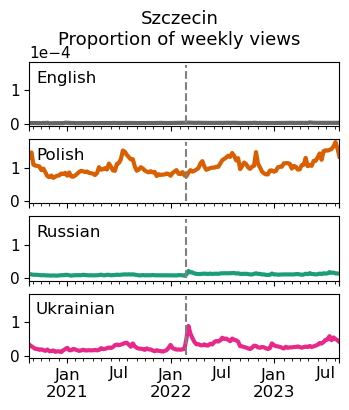

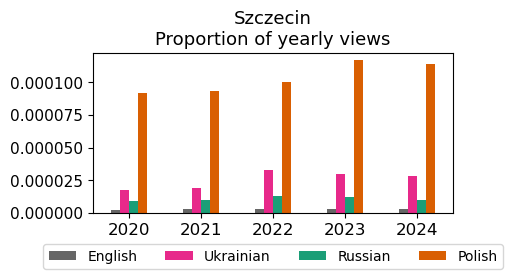

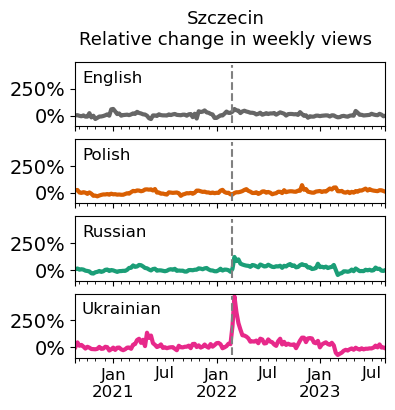

...

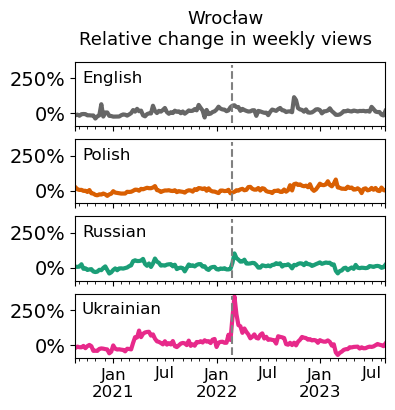

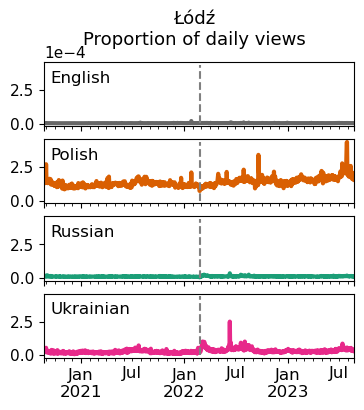

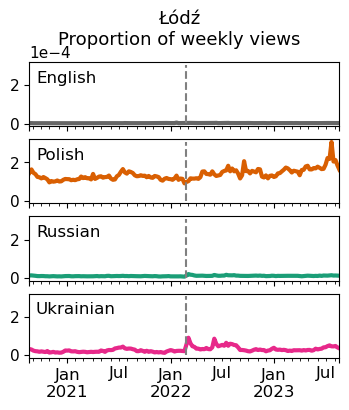

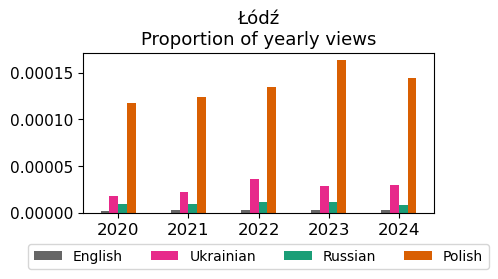

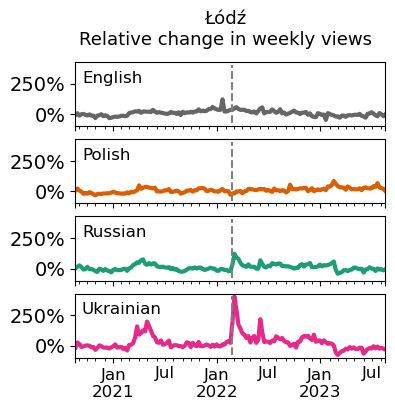

In [13]:
pl_stats = timeseries_relative_change_prop(csv_files, df_denominator, list_off_langs=["Polish"], country_code="PL")

# Other contexts outside Poland

## Germany

In [14]:
# use glob to get all the csv files in the folder
path = os.getcwd()
csv_files = glob.glob(os.path.join(path, "data_cities_DE/*.csv"))

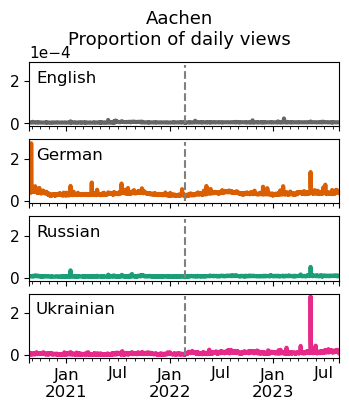

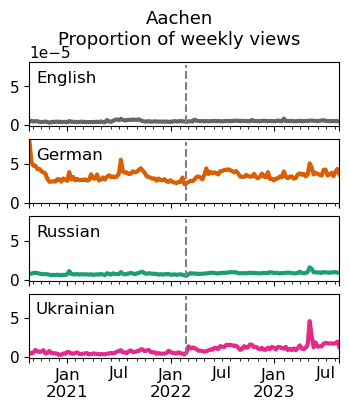

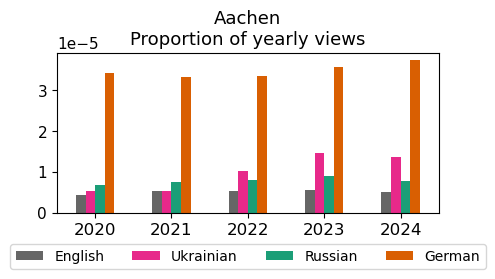

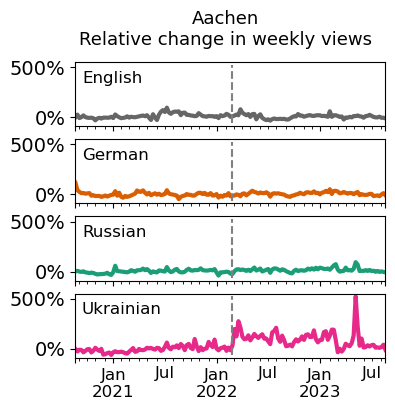

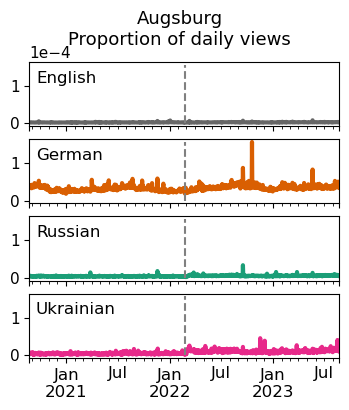

...

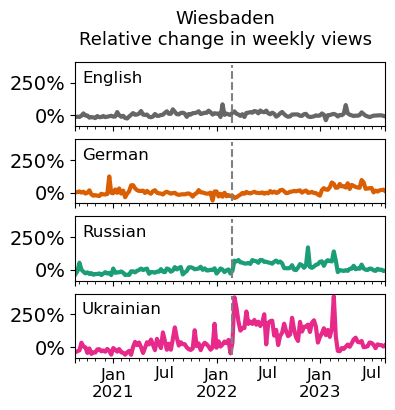

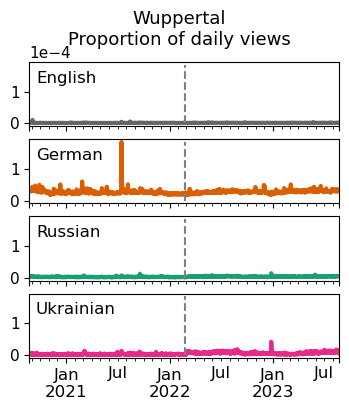

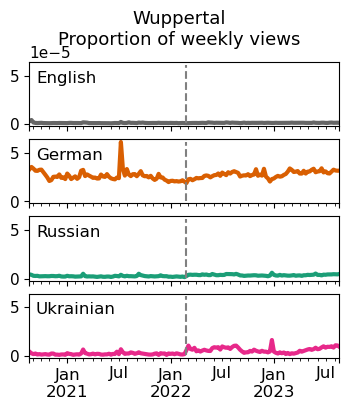

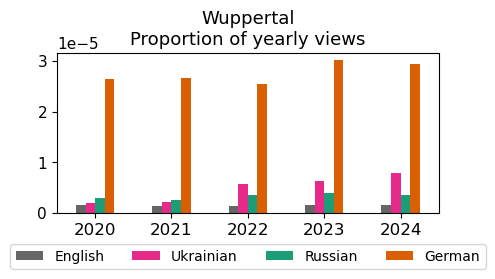

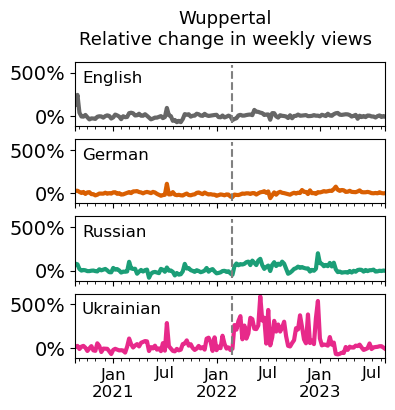

In [15]:
de_stats = timeseries_relative_change_prop(csv_files, df_denominator, list_off_langs=["German"], country_code="DE")

## Top 5 most populous capitals (exclusing Moscow)

In [16]:
# use glob to get all the csv files in the folder
path = os.getcwd()
csv_files = glob.glob(os.path.join(path, "data_cities_WORLD/*.csv"))

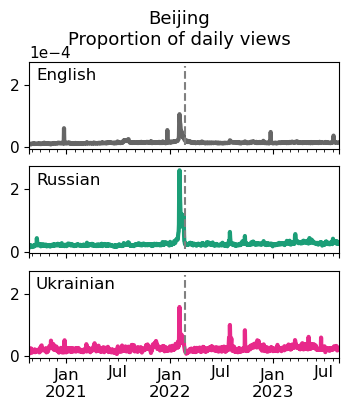

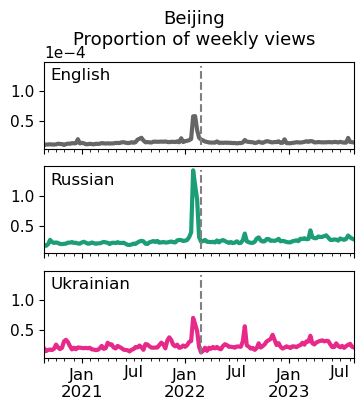

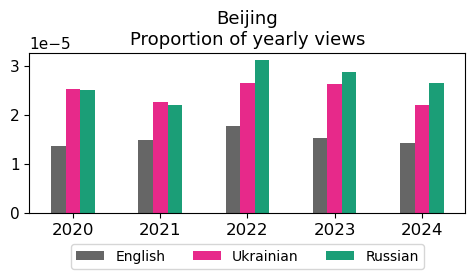

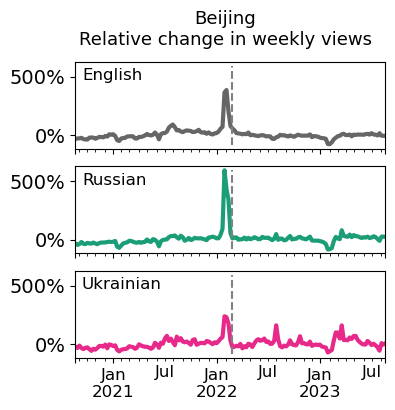

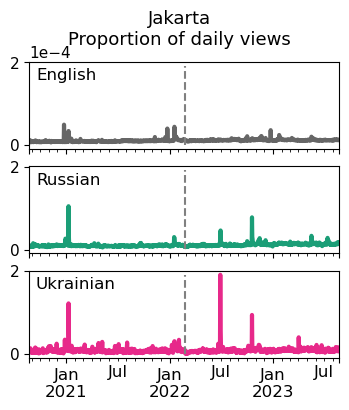

...

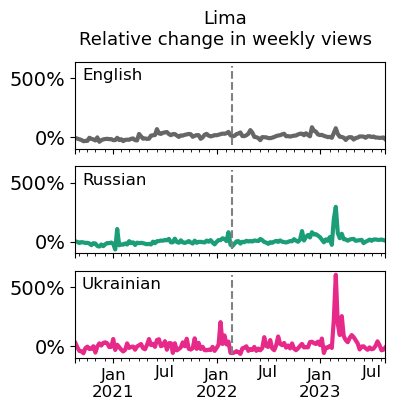

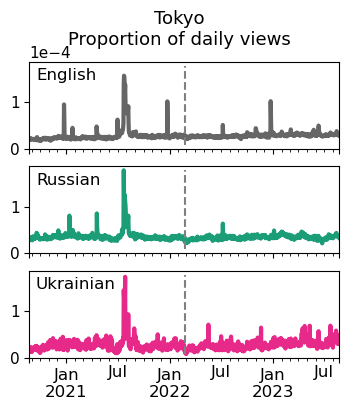

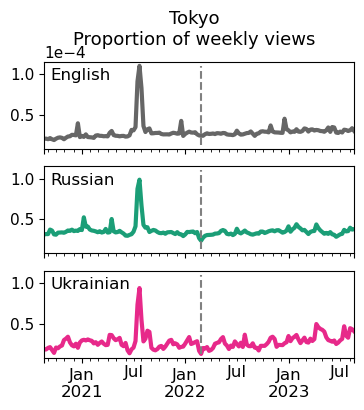

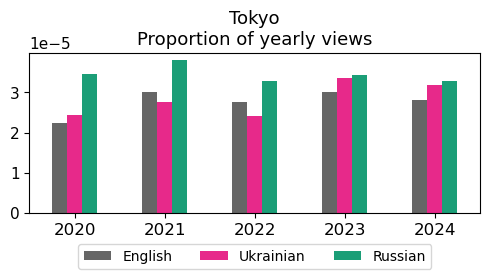

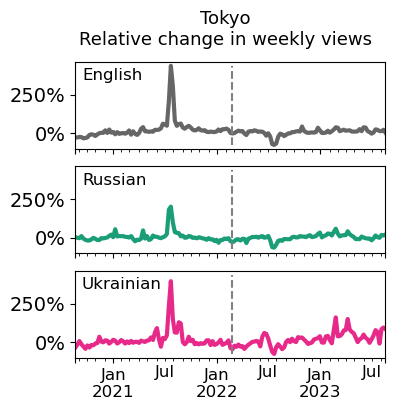

In [17]:
w_capitals_stats = timeseries_relative_change_prop(csv_files, df_denominator, list_off_langs=[""], country_code="WORLD")

# Overview analysis

In [18]:
pl_stats[pl_stats["rel_change_max_within1month"] > 200]

weekly_pre_median  weekly_post_median  \
Białystok Ukrainian        7.300879e-06        1.221420e-05   
          Lithuanian       3.687039e-05        1.137164e-04   
          Chinese          4.244277e-07        6.726204e-07   
          Persian          1.778181e-07        3.181967e-07   
          Arabic           2.825853e-07        3.724538e-07   
...                                 ...                 ...   
Wrocław   Ukrainian        4.056944e-05        6.065057e-05   
          Lithuanian       2.500036e-05        5.374867e-05   
Łódź      Ukrainian        2.125276e-05        3.189622e-05   
          Lithuanian       1.232340e-05        3.232690e-05   
          Indonesian       2.108928e-07        3.786432e-07   

                      diff_weekly_median  rel_change_max_within1month  \
Białystok Ukrainian         4.913318e-06                   408.938045   
          Lithuanian        7.684604e-05                   332.985466   
          Chinese           2.481927e-07                   307.151166   
          Persian           1.403786e-07                   337.013722   
          Arabic            8.986845e-08                   217.498837   
...                                  ...                          ...   
Wrocław   Ukrainian         2.008114e-05                   347.186604   
          Lithuanian        2.874830e-05                   207.396327   
Łódź      Ukrainian         1.064346e-05                   405.949572   
          Lithuanian        2.000350e-05                   230.533685   
          Indonesian        1.677504e-07                   746.488166   

                     rel_change_max_time_within1month  
Białystok Ukrainian                        2022-03-07  
          Lithuanian                       2022-03-07  
          Chinese                          2022-03-07  
          Persian                          2022-03-14  
          Arabic                           2022-03-21  
...                                               ...  
Wrocław   Ukrainian                        2022-03-07  
          Lithuanian                       2022-03-21  
Łódź      Ukrainian                        2022-03-07  
          Lithuanian                       2022-03-21  
          Indonesian                       2022-03-21  

[103 rows x 5 columns]

In [19]:
print_latex_stats(pl_stats[pl_stats["rel_change_max_within1month"] > 200][[ "diff_weekly_median",  
                                                                            "rel_change_max_within1month",
                                                                            "rel_change_max_time_within1month"
                                                                            ]], sort=True)

\begin{tabular}{llrll}
\toprule
 &  & diff_weekly_median & rel_change_max_within1month & rel_change_max_time_within1month \\
\midrule
\multirow[t]{6}{*}{Białystok} & Arabic & 0.000000 & 217.5\% & 21.03.22 \\
 & Chinese & 0.000000 & 307.15\% & 07.03.22 \\
 & Indonesian & 0.000000 & 256.42\% & 21.03.22 \\
 & Lithuanian & 0.000077 & 332.99\% & 07.03.22 \\
 & Persian & 0.000000 & 337.01\% & 14.03.22 \\
 & Ukrainian & 0.000005 & 408.94\% & 07.03.22 \\
\cline{1-5}
\multirow[t]{6}{*}{Bydgoszcz} & Arabic & 0.000000 & 301.36\% & 14.03.22 \\
 & Chinese & 0.000000 & 207.36\% & 14.03.22 \\
 & Indonesian & 0.000000 & 312.36\% & 14.03.22 \\
 & Japanese & 0.000000 & 210.42\% & 28.02.22 \\
 & Russian & 0.000002 & 206.39\% & 07.03.22 \\
 & Ukrainian & 0.000010 & 520.38\% & 07.03.22 \\
\cline{1-5}
\multirow[t]{4}{*}{Częstochowa} & Japanese & 0.000000 & 229.02\% & 28.02.22 \\
 & Lithuanian & 0.000010 & 323.91\% & 21.03.22 \\
 & Persian & 0.000000 & 312.31\% & 28.02.22 \\
 & Ukrainian & 0.000009 & 405.99\

In [20]:
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['figure.figsize'] = 8,5

plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10

In [21]:
def plot_rel_change_scatter(df, colors_langs_dict, langs=["English", "Ukrainian", "Russian"], colx='rel_change_max_time_within1month', coly='rel_change_max_within1month', note="", save=False):

    # Ensure index has names
    if df.index.names != ['Wikipedia page', 'Language']:
        df.index.names = ['Wikipedia page', 'Language']

    df = df[df.index.get_level_values(1).isin(langs)]
    df_reset = df.reset_index()
    
    texts = []

    # Track which languages have already been labeled in the legend
    labeled_langs = set()

    for _, row in df_reset.iterrows():
        lang = row['Language']
        color = colors_langs_dict.get(lang, 'gray')

        plt.scatter(
            row[colx],
            row[coly],
            color=color,
            label=lang if lang not in labeled_langs else "",
            s=20,
            alpha=0.6
        )
        labeled_langs.add(lang)

        # Append text label for adjustment later
        if (row[coly] > 200) or (lang == "Ukrainian"):# and row['Wikipedia page'] in ["Beijin", "Tokyo", "Kinshasa", "Jakarta", "Lima"]):
            texts.append(
                plt.text(
                    row[colx] + pd.DateOffset(hours=4) ,
                    row[coly],
                    row['Wikipedia page'],
                    fontsize=9,
                    alpha=1 if row['Wikipedia page'] == "Katowice" and lang == "Ukrainian" else 0.7,
                    color="black" if row['Wikipedia page'] in ["Beijing", "Tokyo", "Kinshasa", "Jakarta", "Lima"] and lang == "Ukrainian" else "gray"
                ) 
            )

    # Adjust text to avoid overlap
    adjust_text(texts, expand=(2.5, 1), arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

    # Custom legend
    handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=lang,
                   markerfacecolor=color, markersize=9)
        for lang, color in colors_langs_dict.items() if lang in labeled_langs
    ]

    plt.legend(
        title='',
        handles=handles,
        loc='upper right',
        bbox_to_anchor=(1, 1.1),
        ncol=len(handles),
        columnspacing=0.5,
        frameon=True
    )
    #if note == "eu":
    #    plt.legend(title='Language', handles=handles, loc='upper right')
    #else:
    #    plt.legend(title='Language', handles=handles, loc='upper left')

    # Labels and formatting
    ylim_max = int(df[coly].max()*1.2)
    ylim_min = -50 
    if int(df[coly].min()*3) < ylim_min:
        ylim_min = int(df[coly].min()*3)
    
    plt.ylim(ylim_min, ylim_max)
    plt.xlabel("Time of maximum relative change")
    plt.ylabel("Maximum relative change within a month period \n after the Russian invasion of Ukraine (%)")
    #plt.title("Wikipedia Pages Relative Change", loc='right')
    plt.tight_layout()
    
    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/"
        os.makedirs(output_dir, exist_ok=True)                    
        plt.savefig(f"{output_dir}/relchange-max-1month-{note}.pdf", format="pdf", bbox_inches="tight")
        
    plt.show()

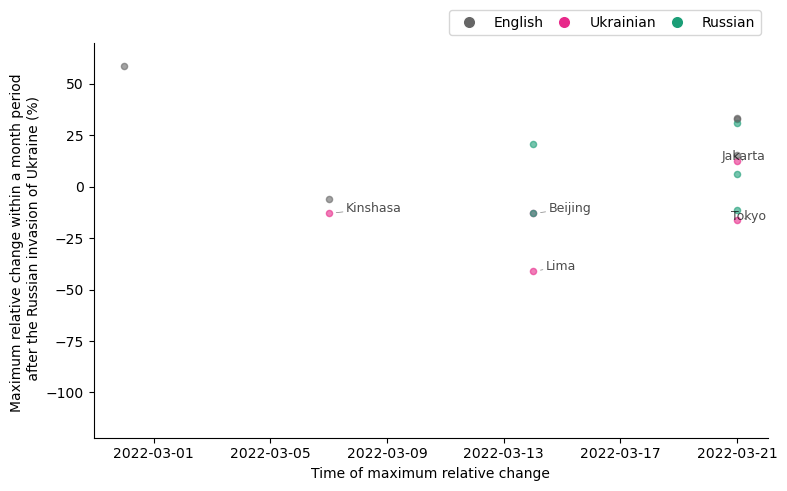

In [22]:
plot_rel_change_scatter(w_capitals_stats, colors_langs_dict, note="world", save=True)

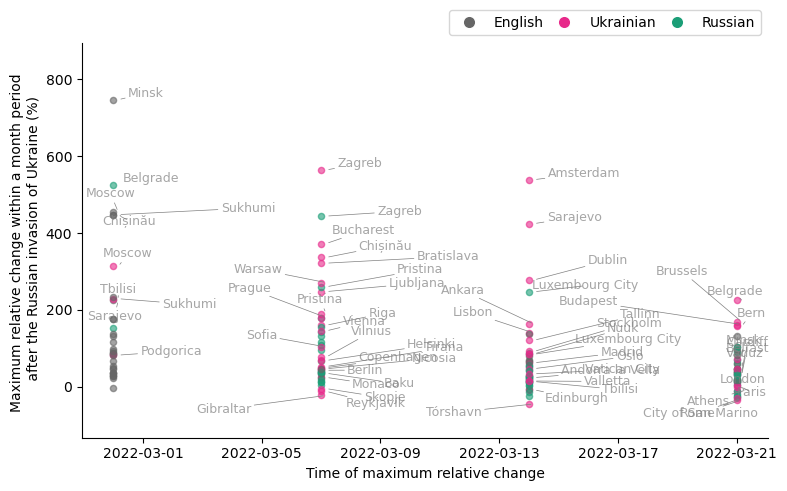

In [23]:
plot_rel_change_scatter(eu_capitals_stats.drop("Kyiv"), colors_langs_dict, note="eu")

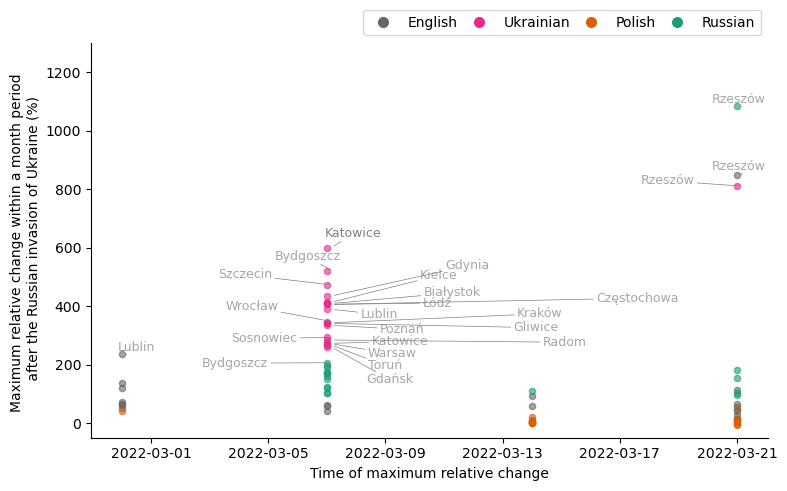

In [24]:
plot_rel_change_scatter(pl_stats, colors_langs_dict, 
                        langs=["English", "Ukrainian", "Russian", "Polish"], note="pl", save=True)

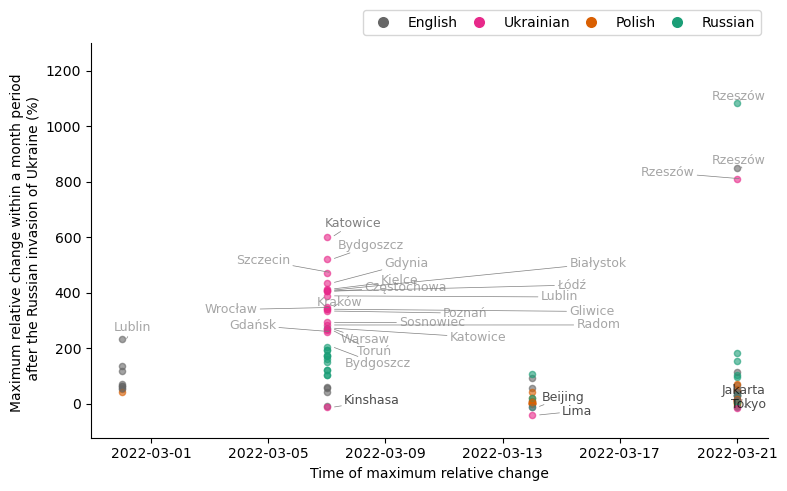

In [25]:
plot_rel_change_scatter(pd.concat([pl_stats, w_capitals_stats]), colors_langs_dict, 
                        langs=["English", "Ukrainian", "Russian", "Polish"], note="pl+world", save=True)

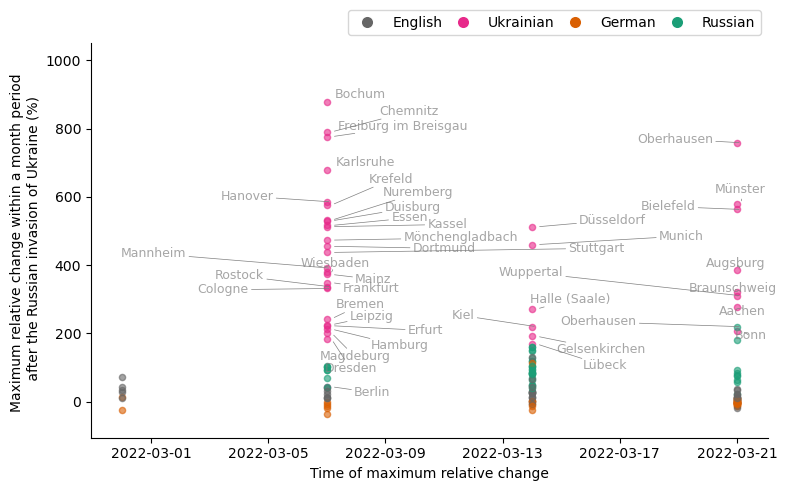

In [26]:
plot_rel_change_scatter(pd.concat([de_stats]), colors_langs_dict, 
                        langs=["English", "Ukrainian", "Russian", "German"], note="de", save=True)

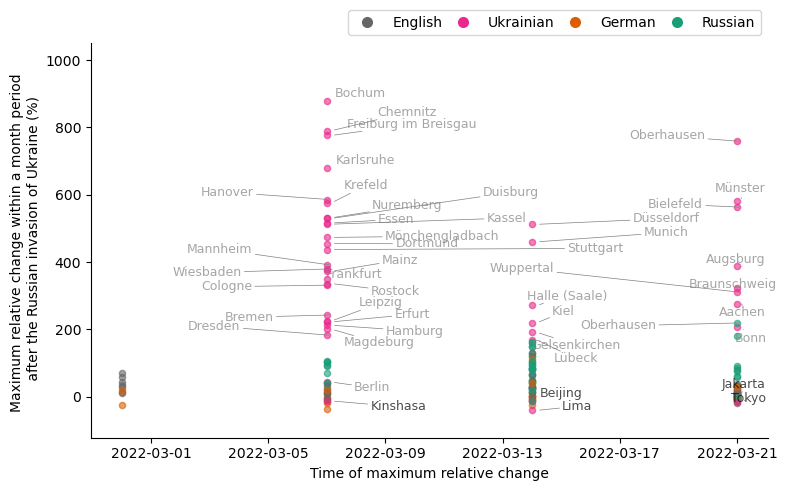

In [27]:
plot_rel_change_scatter(pd.concat([de_stats, w_capitals_stats]), colors_langs_dict, 
                        langs=["English", "Ukrainian", "Russian", "German"], note="de+world", save=True)